In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!pip install pytorch-lightning

In [ ]:
!nvidia-smi

Tue Nov 15 18:13:48 2022       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 460.32.03    Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   33C    P8     9W /  70W |      0MiB / 15109MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [ ]:
from __future__ import print_function

%cd /content/drive/MyDrive/VQVAE

import matplotlib.pyplot as plt
import numpy as np
from scipy.signal import savgol_filter


from six.moves import xrange

import IPython.display as display_audio
import IPython

# import umap
import os
import soundfile
from pathlib import Path

import torch
import torch.nn as nn
import torch.nn.functional as F

import torch.optim as optim


import torchvision.datasets as datasets
import torchvision.transforms as transforms
from torchvision.utils import make_grid

import pytorch_lightning as pl

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")



from datasets.vas import DataModule


spec_dir_path = './data/vas/features/*/melspec_10s_22050hz'
mel_num =  80
spec_len = 860
spec_crop_len = 848
random_crop = False
batch_size = 3

data = DataModule(batch_size =batch_size, 
                  spec_dir_path = spec_dir_path, 
                  mel_num = mel_num, 
                  spec_len = spec_len, 
                  spec_crop_len =spec_crop_len, 
                  random_crop =random_crop,
                  num_workers=4)

data.setup()

/content/drive/MyDrive/VQVAE


In [ ]:
# # ##create .py files

# %%writefile big_model_attn.py
# print("everything's fine.")

Writing big_model_attn.py


## Load Data

In [ ]:
# #### test batch generation time 
# import time

# for i in range(100):
#   start_t = time.time()

#   batch = next(iter(data.train_dataloader()))

#   print(f'Sampling Time: {time.time() - start_t:3.2f} seconds')

####Model initialisation

This is a simple model

In [ ]:
import pytorch_lightning as pl
from models.vqvae import LitVQVAE


# batch_size = 256
num_training_updates = 1500000

num_hiddens = 128
num_residual_hiddens = 32
num_residual_layers = 2

embedding_dim = 256 # 64
num_embeddings = 128 #512

commitment_cost = 0.25

decay = 0.99

learning_rate = 1e-6

model = LitVQVAE(num_hiddens, num_residual_layers, num_residual_hiddens,
              num_embeddings, embedding_dim, 
              commitment_cost)

In [ ]:
batch_test = next(iter(data.val_dataloader()))['image'].unsqueeze(1)

model(batch_test)

bigger model testing here

In [ ]:
from models.bigger_model import LitVQVAE

# batch_size = 256
num_training_updates = 1500000

num_hiddens = 128
num_residual_hiddens = 32
num_residual_layers = 2

embedding_dim = 256 # 64
num_embeddings = 128 #512

commitment_cost = 0.25

decay = 0.99

learning_rate = 1e-6


model = LitVQVAE(
                #num_hiddens, num_residual_layers, num_residual_hiddens,
                num_embeddings, embedding_dim, 
                commitment_cost)

In [ ]:
model

big model including attn, loss is mean

In [ ]:
from models.big_model_attn import LitVQVAE

embedding_dim = 256 # 64
num_embeddings = 128 #512

commitment_cost = 0.25

# learning_rate = 1e-3


model_old = LitVQVAE(num_embeddings, embedding_dim, commitment_cost)

big model including attn, loss is mean and GAN!!!

In [ ]:
from models.big_model_attn_gan import LitVQVAE

embedding_dim = 256 # 64
num_embeddings = 128 #512

commitment_cost = 0.25

learning_rate = 1e-6 * batch_size


disc_conditional= False
disc_in_channels= 1
disc_start= 2001
disc_weight= 0.8
codebook_weight= 1.0
min_adapt_weight= 1.0
max_adapt_weight= 1.0


                 

model = LitVQVAE(num_embeddings, embedding_dim, commitment_cost,
                 disc_start = disc_start, 
                 codebook_weight=codebook_weight,
                 disc_num_layers=3, 
                 disc_in_channels=disc_in_channels, 
                 disc_factor=1.0, 
                 disc_weight=disc_weight,
                 use_actnorm=False, 
                 disc_conditional=disc_conditional,
                 disc_ndf=64, 
                 min_adapt_weight=min_adapt_weight, 
                 max_adapt_weight=max_adapt_weight,
                 learning_rate = learning_rate,
                 )

In [ ]:
help(model.log)

## Train

We use the hyperparameters from the author's code:

In [ ]:
torch.cuda.empty_cache()

In [ ]:
from pytorch_lightning.callbacks import ModelCheckpoint
from pytorch_lightning.loggers import TensorBoardLogger

experiment_dir = 'lightning_logs/vqvae'

checkpoint_callback = ModelCheckpoint(save_top_k = 2,
                                       monitor="val/total_loss",
                                      mode="min",
                                      save_last= True,
                                      filename='model-{epoch:02d}'
                                      )

logger = TensorBoardLogger(save_dir = experiment_dir, name = 'big_model_attn_GAN')

trainer = pl.Trainer(default_root_dir= experiment_dir, 
                    accelerator='gpu',
                     max_epochs=60,
                     callbacks=[checkpoint_callback],
                     logger = logger,
                    #  limit_train_batches = 100,
                    #  limit_val_batches= 100,
                    #  fast_dev_run = True
                     )



trainer.fit(model, 
            data, 
            ckpt_path = "lightning_logs/vqvae/big_model_attn_GAN/version_5/checkpoints/last.ckpt"
            )



INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.utilities.rank_zero:Restoring states from the checkpoint path at lightning_logs/vqvae/big_model_attn_GAN/version_5/checkpoints/last.ckpt
/usr/local/lib/python3.7/dist-packages/pytorch_lightning/callbacks/model_checkpoint.py:347: UserWarning: The dirpath has changed from 'lightning_logs/vqvae/big_model_attn_GAN/version_5/checkpoints' to 'lightning_logs/vqvae/big_model_attn_GAN/version_6/checkpoints', therefore `best_model_score`, `kth_best_model_path`, `kth_value`, `last_model_path` and `best_k_models` won't be reloaded. Only `best_model_path` will be reloaded.
  f"The dirpath has changed from {dirpath_from_ckpt!r} to {self.dirpath!r},"
INFO:pyto

Sanity Checking: 0it [00:00, ?it/s]

Previous Epoch counts: [82, 0, 0, 0, 0, 0, 130, 0, 0, 0, 0, 0, 0, 0, 0, 0, 75, 224, 0, 0, 35, 0, 0, 0, 0, 0, 363, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 187, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 41, 0, 0, 0, 55, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 75, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 163, 0, 160, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


Training: 3925it [00:00, ?it/s]

In [ ]:
model.learning_rate

3e-06

In [ ]:
model._encoder = model_old._encoder

model._vq_vae = model_old._vq_vae         
model._decoder  =   model_old._decoder   
model.quant_conv  =  model_old.quant_conv  
model.post_quant_conv = model_old.post_quant_conv


In [ ]:
model_old = model_old.load_from_checkpoint(
                            "lightning_logs/vqvae/big_model_attn/version_0/checkpoints/last.ckpt",
                            num_embeddings = num_embeddings, 
                            embedding_dim= embedding_dim, 
                            commitment_cost=commitment_cost,
                            )

## Plot Loss

In [ ]:
!kill 421

/bin/bash: line 0: kill: (421) - No such process


In [ ]:
%load_ext tensorboard
%tensorboard --logdir=/content/drive/MyDrive/VQVAE/lightning_logs --load_fast=false


import IPython

display(IPython.display.HTML('''
<button id='open_tb'>Open TensorBoard</button> 
<button id='hide_tb'>Hide TensorBoard</button> 
<script>document.querySelector('#open_tb').onclick = () => { window.open(document.querySelector('iframe').src, "__blank") }
        document.querySelector('#hide_tb').onclick = () => { document.querySelector('iframe').style.display = "none" }</script>'''))

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
model

## View Reconstructions

In [ ]:
import yaml
from vocoder.modules import Generator

def show(img):
    npimg = img.numpy()
    fig = plt.imshow(np.transpose(npimg, (1,2,0)), interpolation='nearest', aspect='auto')
    fig.axes.get_xaxis().set_visible(False)
    fig.axes.get_yaxis().set_visible(False)


def tensor_to_plt(x, vmin=None, vmax=None, flip_dims=None):
    if flip_dims is not None:
        # dims is a tuple. To flip only 2nd dim use: `flip_dims=(2,)`
        x = x.flip(dims=flip_dims)
    # remove batch dim and make channel-last
    if len(x.shape) > 3:
        x = x.squeeze(0)
    # if the figure is taller than it is wider rotate (transpose). Also clipping it as feats can be large
    if x.shape[-1] < x.shape[-2]:
        x = x.clip(-2, 2).transpose(-1, -2)
    x = x.cpu().data
    if len(x.shape) == 3:
        x = x.permute(1, 2, 0)
    # fig, arr = plt.subplots(nrows=1, ncols=1)
    # # arr[i].set_title(f'{vid_name}_{name}')
    # arr.imshow(x)
    # arr.set_frame_on(False)
    fig = plt.figure(frameon=False, figsize = (30,5))
    ax = fig.add_axes([0, 0, 1, 1])
    ax.axis('off')
    # for facehq
    # TODO: if x.shape[0] == 3:
    #     x = x.flip(dims=(1,)).permute(1, 2, 0)
    #     x = (x + 1) / 2
    #     x = x.clip(0, 1)

    # newer version of the matplotlib started to fails when an image has 3 dim with `1` as the last one
    if x.ndim == 3 and x.shape[-1] == 1:
        x = x[:, :, 0]

    # plt.figure(figsize = (30,5))
    ax.imshow(x, cmap=plt.get_cmap('gray'), vmin=vmin, vmax=vmax, aspect='auto')
    # ax.set_title('Some', fontsize=8)
    # return fig


def spec_to_audio_to_st(x, sample_rate, vocoder=None, show_in_st=True):
    # audios are in [-1, 1], making them in [0, 1]
    spec = (x.data.squeeze(0) + 1) / 2

    out = {}
    if vocoder:
        # (L,) <- wave: (1, 1, L).squeeze() <- spec: (1, F, T)
        wave_from_vocoder = vocoder(spec).squeeze().cpu().numpy()
        out['vocoder'] = wave_from_vocoder
        if show_in_st:
            show_wave_in_streamlit(wave_from_vocoder, sample_rate, 'Reconstructed Wave via MelGAN')

    return out

def get_class_preditions(x, feat_extractor, k=10):
    # use device=torch.device('cpu') to compute on cpu and save some memory
    device = x.device
    x = {'image': x.squeeze(0).cpu()}
    x = feat_extractor['transforms'](x).to(device)
    features = feat_extractor['model'](x)
    featuresdict = feat_extractor['model'].convert_features_tuple_to_dict(features)
    probs = featuresdict['logits'].softmax(dim=1)
    topk_probs, topk_targets = probs.topk(k)
    to_print = f'Spectrogram Classifier (K={k}):\n'
    for p, y in zip(topk_probs.squeeze(0).cpu().tolist(), topk_targets.squeeze(0).cpu().tolist()):
        to_print += f'\t{feat_extractor["target2label"][y]}: {p:.5f}\n'
    return to_print

def load_vocoder(ckpt_vocoder: str, eval_mode: bool):
    ckpt_vocoder = Path(ckpt_vocoder)
    vocoder_sd = torch.load(ckpt_vocoder / 'best_netG.pt', map_location='cpu')

    with open(ckpt_vocoder / 'args.yml', 'r') as f:
        args = yaml.load(f, Loader=yaml.UnsafeLoader)

    vocoder = Generator(args.n_mel_channels, args.ngf, args.n_residual_layers)
    vocoder.load_state_dict(vocoder_sd)

    if eval_mode:
        vocoder.eval()

    return {'model': vocoder}

import time

# aux models (vocoder and melception)
ckpt_melgan = './vocoder/logs/vggsound/'
melgan = load_vocoder(ckpt_melgan, eval_mode=True)['model'].to(device)

# we might go here later
# melception = load_feature_extractor(gpu = True if device.type == 'cuda' else False, eval_mode=True)

In [ ]:
from datasets.vas import DataModule


spec_dir_path = './data/vas/features/*/melspec_10s_22050hz'
mel_num =  80
spec_len = 860
spec_crop_len = 848
random_crop = False
batch_size = 1

data_for_testing = DataModule(batch_size =batch_size, 
                  spec_dir_path = spec_dir_path, 
                  mel_num = mel_num, 
                  spec_len = spec_len, 
                  spec_crop_len =spec_crop_len, 
                  random_crop =random_crop,
                  num_workers=4)

data_for_testing.setup()

model_normal = model.model

/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:566: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))


baby


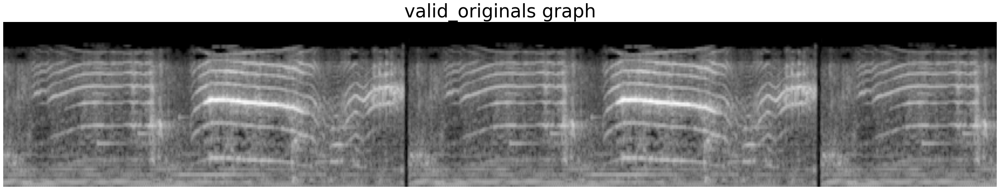

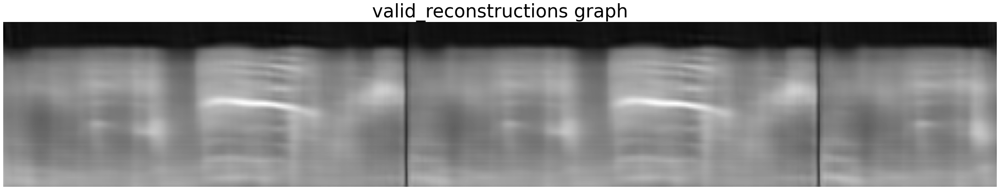

Sampling Time: 7.23 seconds
Sampling Time (with vocoder): 7.31 seconds
Generated: 9.85 seconds
The sample has been saved @ log/video_01933.wav


In [ ]:

model_normal.eval().to(device)

valid_originals = next(iter(data_for_testing.val_dataloader()))

file_path = '/content/drive/MyDrive/AV_Datasets/VAS/'+valid_originals['label'][0]+'/videos/'+valid_originals['file_path_'][0][-19:-8]+'.mp4'

print(valid_originals['label'][0])

valid_originals_file = valid_originals['file_path_'][0]

valid_originals = valid_originals['image'].unsqueeze(1)
valid_originals = valid_originals.to(device)

start_t = time.time()

vq_output_eval = model_normal._encoder(valid_originals)
_, valid_quantize, _, _ = model_normal._vq_vae(vq_output_eval)
valid_reconstructions = model_normal._decoder(valid_quantize)


IPython.display.display(display_audio.Audio(file_path))
plt.show()



tensor_to_plt(valid_originals, flip_dims=(2,))
plt.title("valid_originals graph", fontsize=40)
plt.show()

tensor_to_plt(valid_reconstructions, flip_dims=(2,))
plt.title("valid_reconstructions graph", fontsize=40)
plt.show()

# Start sampling
with torch.no_grad():


    # quant_z_shape = sampling_shape
    z_pred_img = valid_reconstructions

    print(f'Sampling Time: {time.time() - start_t:3.2f} seconds')
    waves = spec_to_audio_to_st(z_pred_img, 22050, vocoder=melgan, show_in_st=False)
    print(f'Sampling Time (with vocoder): {time.time() - start_t:3.2f} seconds')
    print(f'Generated: {len(waves["vocoder"]) / 22050:.2f} seconds')

    # Melception opinion on the class distribution of the generated sample
    # topk_preds = get_class_preditions(z_pred_img, melception)
    # print(topk_preds)

save_path = os.path.join('log/', Path(file_path).stem + '.wav')
soundfile.write(save_path, waves['vocoder'], 22050, 'PCM_24')
print(f'The sample has been saved @ {save_path}')

IPython.display.display(display_audio.Audio(save_path))
plt.show()



# plt.figure(figsize = (30,5))
# show(valid_reconstructions[0].cpu().data)
# plt.show()

# plt.figure(figsize = (30,5))
# show(make_grid(valid_originals[0].cpu()+0.5))
# plt.show()

In [ ]:
model

In [ ]:
model_normal.eval()

train_originals = next(iter(data_for_testing.train_dataloader()))

file_path = '/content/drive/MyDrive/AV_Datasets/VAS/'+train_originals['label'][0]+'/videos/'+train_originals['file_path_'][0][-19:-8]+'.mp4'

print(train_originals['label'][0])

train_originals = train_originals['image'].unsqueeze(1)[0].unsqueeze(0)

train_originals = train_originals.to(device)

start_t = time.time()

vq_output_eval = model_normal._encoder(train_originals)
_, train_quantize, _, _ = model_normal._vq_vae(vq_output_eval)
train_reconstructions = model_normal._decoder(train_quantize)



IPython.display.display(display_audio.Audio(file_path))
plt.show()



tensor_to_plt(train_originals, flip_dims=(2,))
plt.title("train_originals graph", fontsize=40)
plt.show()

tensor_to_plt(train_reconstructions, flip_dims=(2,))
plt.title("train_reconstructions graph", fontsize=40)
plt.show()

# Start sampling
with torch.no_grad():


    # quant_z_shape = sampling_shape
    z_pred_img = train_reconstructions

    print(f'Sampling Time: {time.time() - start_t:3.2f} seconds')
    waves = spec_to_audio_to_st(z_pred_img, 22050, vocoder=melgan, show_in_st=False)
    print(f'Sampling Time (with vocoder): {time.time() - start_t:3.2f} seconds')
    print(f'Generated: {len(waves["vocoder"]) / 22050:.2f} seconds')

    # Melception opinion on the class distribution of the generated sample
    # topk_preds = get_class_preditions(z_pred_img, melception)
    # print(topk_preds)

save_path = os.path.join('log/', Path(file_path).stem + '.wav')
soundfile.write(save_path, waves['vocoder'], 22050, 'PCM_24')
print(f'The sample has been saved @ {save_path}')

IPython.display.display(display_audio.Audio(save_path))
plt.show()





# plt.figure(figsize = (30,5))
# show(make_grid(train_reconstructions[0].cpu().data)+0.5, )
# plt.show()

# plt.figure(figsize = (30,5))
# show(make_grid(train_originals[0].cpu()+0.5))
# plt.show()

Output hidden; open in https://colab.research.google.com to view.

####NEW sounds

In [ ]:
%cd /content/drive/MyDrive/VQVAE

from datasets.vas import Crop

model_normal.eval()

file_path = '/content/drive/MyDrive/MusMelSpecVQVAE/myaudios/475681__liezen3__synthethic-violin.wav' # "/content/drive/MyDrive/MusMelSpecVQVAE/myaudios/431166__inspectorj__voice-request-37-okay-i-quit-no-sfx.wav" #

from feature_extraction.demo_utils import (check_video_for_audio, extract_melspectrogram)

if check_video_for_audio(file_path):
  # Extract Spectrogram
  audio_fps = 22050
  spectrogram = extract_melspectrogram(file_path, audio_fps)
  spectrogram = {'input': spectrogram}
  # [80, 860] -> [80, 848]
  random_crop = False
  crop_img_fn = Crop([80, 848], random_crop)
  spectrogram = crop_img_fn(spectrogram)

  input = torch.tensor(spectrogram['input']).unsqueeze(0).unsqueeze(0).to(device)

  # Encode and Decode the Spectrogram
  with torch.no_grad():

    start_t = time.time()

    vq_output_eval = model_normal._encoder(input)
    _, train_quantize, _, _ = model_normal._vq_vae(vq_output_eval)
    input_reconstructions = model_normal._decoder(train_quantize)

    IPython.display.display(display_audio.Audio(file_path))
    plt.show()



    tensor_to_plt(input, flip_dims=(2,))
    plt.title("input graph", fontsize=40)
    plt.show()

    tensor_to_plt(input_reconstructions, flip_dims=(2,))
    plt.title("input_reconstructions graph", fontsize=40)
    plt.show()

    # quant_z_shape = sampling_shape
    z_pred_img = input_reconstructions


    print(f'Sampling Time: {time.time() - start_t:3.2f} seconds')
    waves = spec_to_audio_to_st(z_pred_img, 22050, vocoder=melgan, show_in_st=False)
    print(f'Sampling Time (with vocoder): {time.time() - start_t:3.2f} seconds')
    print(f'Generated: {len(waves["vocoder"]) / 22050:.2f} seconds')

    # Melception opinion on the class distribution of the generated sample
    # topk_preds = get_class_preditions(z_pred_img, melception)
    # print(topk_preds)

    save_path = os.path.join('log/', Path(file_path).stem + '.wav')
    soundfile.write(save_path, waves['vocoder'], 22050, 'PCM_24')
    print(f'The sample has been saved @ {save_path}')

    IPython.display.display(display_audio.Audio(save_path))
    plt.show()


Output hidden; open in https://colab.research.google.com to view.

###Generate random laten variables and sounds


/content/drive/MyDrive/VQVAE
tensor([[0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        ...,
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.]], device='cuda:0')
random latent vector sahpe: torch.Size([1, 256, 20, 212])


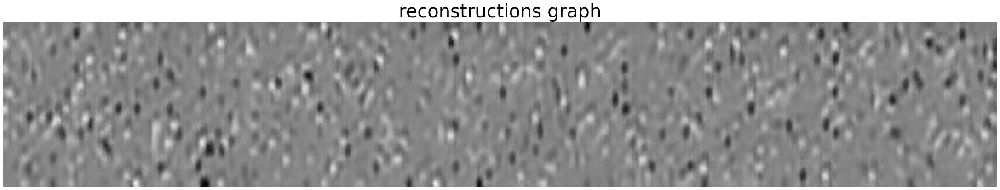

Sampling Time: 0.51 seconds
Sampling Time (with vocoder): 0.58 seconds
Generated: 9.85 seconds
The sample has been saved @ log/60.wav


In [ ]:
import random
%cd /content/drive/MyDrive/VQVAE

model_normal.eval()


# Extract Spectrogram
audio_fps = 22050


#### generate random latent vector

z = torch.zeros(4240,128).to(device)

random.randint(0,127)

for i in range(4240):
  z[i, random.randint(0,127)] = 1

print(z)
z.shape

with torch.no_grad():
  vector = torch.matmul(z, model_normal._vq_vae._embedding.weight)

  vector_reshaped = torch.reshape(vector, (1, 20, 212,256)).permute(0,3,1,2)

print("random latent vector sahpe:", vector_reshaped.shape)


# Encode and Decode the Spectrogram
with torch.no_grad():

  start_t = time.time()

  # vq_output_eval = model_normal._encoder(input)
  # _, train_quantize, _, _ = model_normal._vq_vae(vq_output_eval)
  input_reconstructions = model_normal._decoder(vector_reshaped)

  tensor_to_plt(input_reconstructions, flip_dims=(2,))
  plt.title("reconstructions graph", fontsize=40)
  plt.show()

  # quant_z_shape = sampling_shape
  z_pred_img = input_reconstructions


  print(f'Sampling Time: {time.time() - start_t:3.2f} seconds')
  waves = spec_to_audio_to_st(z_pred_img, 22050, vocoder=melgan, show_in_st=False)
  print(f'Sampling Time (with vocoder): {time.time() - start_t:3.2f} seconds')
  print(f'Generated: {len(waves["vocoder"]) / 22050:.2f} seconds')

  # Melception opinion on the class distribution of the generated sample
  # topk_preds = get_class_preditions(z_pred_img, melception)
  # print(topk_preds)

  save_path = os.path.join('log/', str(random.randint(0,127)) + '.wav')
  soundfile.write(save_path, waves['vocoder'], 22050, 'PCM_24')
  print(f'The sample has been saved @ {save_path}')

  IPython.display.display(display_audio.Audio(save_path))
  plt.show()


## View Embedding

In [ ]:
!pip uninstall umap
!pip install umap-learn

In [ ]:
import umap.umap_ as umap
proj = umap.UMAP(n_neighbors=3,
                 min_dist=0.1,
                 metric='cosine').fit_transform(model._vq_vae._embedding.weight.data.cpu())

In [ ]:
plt.scatter(proj[:,0], proj[:,1], alpha=0.3)

In [ ]:
model

#### Latent usage control

In [ ]:
model_normal.eval()

indecies = []

for i in xrange(100):
  data_latent_test = next(iter(data.train_dataloader()))['image'].unsqueeze(1)
  data_latent_test = data_latent_test.to(device)

  vq_output_eval = model_normal._encoder(data_latent_test)
  loss, train_quantize, perplexity, encodings = model_normal._vq_vae(vq_output_eval)
  # train_reconstructions = model._decoder(train_quantize)


  indecies = np.append(indecies, torch.argmax(encodings, dim=1).cpu().numpy())

      
  # train_res_recon_error.append(recon_error.item())
  # train_res_perplexity.append(perplexity.item())

encodings_inx = indecies

Traceback (most recent call last):
  File "/usr/lib/python3.7/multiprocessing/util.py", line 300, in _run_finalizers
    finalizer()
  File "/usr/lib/python3.7/multiprocessing/util.py", line 224, in __call__
    res = self._callback(*self._args, **self._kwargs)
  File "/usr/lib/python3.7/multiprocessing/util.py", line 133, in _remove_temp_dir
    rmtree(tempdir)
  File "/usr/lib/python3.7/shutil.py", line 498, in rmtree
    onerror(os.rmdir, path, sys.exc_info())
  File "/usr/lib/python3.7/shutil.py", line 496, in rmtree
    os.rmdir(path)
OSError: [Errno 39] Directory not empty: '/tmp/pymp-j92w0dn_'


In [ ]:
encodings_inx.shape

(212000,)

In [ ]:
import matplotlib.pyplot as plt


# Plot Histogram on x
x = encodings_inx
fig = plt.hist(x, bins=128, density=False)



# frequency, bins = np.histogram(x, bins=128, range=[0, 128])

# for b, f in zip(bins[1:], frequency):
#     print(round(b, 1), ' '.join(np.repeat('*', f)))

In [ ]:
import matplotlib.pyplot as plt


# Plot Histogram on x
x = encodings_inx
fig =plt.hist(x, bins=128)



# frequency, bins = np.histogram(x, bins=128, range=[0, 128])

# for b, f in zip(bins[1:], frequency):
#     print(round(b, 1), ' '.join(np.repeat('*', f)))

In [ ]:
!pip install omegaconf==2.0.6

In [ ]:
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)

class NLayerDiscriminator(nn.Module):
    """Defines a PatchGAN discriminator as in Pix2Pix
        --> see https://github.com/junyanz/pytorch-CycleGAN-and-pix2pix/blob/master/models/networks.py
    """
    def __init__(self, input_nc=3, ndf=64, n_layers=3, use_actnorm=False):
        """Construct a PatchGAN discriminator
        Parameters:
            input_nc (int)  -- the number of channels in input images
            ndf (int)       -- the number of filters in the last conv layer
            n_layers (int)  -- the number of conv layers in the discriminator
            norm_layer      -- normalization layer
        """
        super(NLayerDiscriminator, self).__init__()
        if not use_actnorm:
            norm_layer = nn.BatchNorm2d
        else:
            norm_layer = ActNorm
        if type(norm_layer) == functools.partial:  # no need to use bias as BatchNorm2d has affine parameters
            use_bias = norm_layer.func != nn.BatchNorm2d
        else:
            use_bias = norm_layer != nn.BatchNorm2d

        kw = 4
        padw = 1
        sequence = [nn.Conv2d(input_nc, ndf, kernel_size=kw, stride=2, padding=padw), nn.LeakyReLU(0.2, True)]
        nf_mult = 1
        nf_mult_prev = 1
        for n in range(1, n_layers):  # gradually increase the number of filters
            nf_mult_prev = nf_mult
            nf_mult = min(2 ** n, 8)
            sequence += [
                nn.Conv2d(ndf * nf_mult_prev, ndf * nf_mult, kernel_size=kw, stride=2, padding=padw, bias=use_bias),
                norm_layer(ndf * nf_mult),
                nn.LeakyReLU(0.2, True)
            ]

        nf_mult_prev = nf_mult
        nf_mult = min(2 ** n_layers, 8)
        sequence += [
            nn.Conv2d(ndf * nf_mult_prev, ndf * nf_mult, kernel_size=kw, stride=1, padding=padw, bias=use_bias),
            norm_layer(ndf * nf_mult),
            nn.LeakyReLU(0.2, True)
        ]
        # output 1 channel prediction map
        sequence += [nn.Conv2d(ndf * nf_mult, 1, kernel_size=kw, stride=1, padding=padw)]
        self.main = nn.Sequential(*sequence)

    def forward(self, input):
        """Standard forward."""
        return self.main(input)


from collections import namedtuple

import numpy as np
import torch
import torch.nn as nn
import functools

import sys
sys.path.insert(0, '.')  # nopep8




import hashlib
import os

import requests
from tqdm import tqdm

URL_MAP = {
    'vggishish_lpaps': 'https://a3s.fi/swift/v1/AUTH_a235c0f452d648828f745589cde1219a/specvqgan_public/vggishish16.pt',
    'vggishish_mean_std_melspec_10s_22050hz': 'https://a3s.fi/swift/v1/AUTH_a235c0f452d648828f745589cde1219a/specvqgan_public/train_means_stds_melspec_10s_22050hz.txt',
    'melception': 'https://a3s.fi/swift/v1/AUTH_a235c0f452d648828f745589cde1219a/specvqgan_public/melception-21-05-10T09-28-40.pt',
}

CKPT_MAP = {
    'vggishish_lpaps': 'vggishish16.pt',
    'vggishish_mean_std_melspec_10s_22050hz': 'train_means_stds_melspec_10s_22050hz.txt',
    'melception': 'melception-21-05-10T09-28-40.pt',
}

MD5_MAP = {
    'vggishish_lpaps': '197040c524a07ccacf7715d7080a80bd',
    'vggishish_mean_std_melspec_10s_22050hz': 'f449c6fd0e248936c16f6d22492bb625',
    'melception': 'a71a41041e945b457c7d3d814bbcf72d',
}


def download(url, local_path, chunk_size=1024):
    os.makedirs(os.path.split(local_path)[0], exist_ok=True)
    with requests.get(url, stream=True) as r:
        total_size = int(r.headers.get("content-length", 0))
        with tqdm(total=total_size, unit="B", unit_scale=True) as pbar:
            with open(local_path, "wb") as f:
                for data in r.iter_content(chunk_size=chunk_size):
                    if data:
                        f.write(data)
                        pbar.update(chunk_size)


def md5_hash(path):
    with open(path, "rb") as f:
        content = f.read()
    return hashlib.md5(content).hexdigest()


def get_ckpt_path(name, root, check=False):
    assert name in URL_MAP
    path = os.path.join(root, CKPT_MAP[name])
    if not os.path.exists(path) or (check and not md5_hash(path) == MD5_MAP[name]):
        print("Downloading {} model from {} to {}".format(name, URL_MAP[name], path))
        download(URL_MAP[name], path)
        md5 = md5_hash(path)
        assert md5 == MD5_MAP[name], md5
    return path


class KeyNotFoundError(Exception):
    def __init__(self, cause, keys=None, visited=None):
        self.cause = cause
        self.keys = keys
        self.visited = visited
        messages = list()
        if keys is not None:
            messages.append("Key not found: {}".format(keys))
        if visited is not None:
            messages.append("Visited: {}".format(visited))
        messages.append("Cause:\n{}".format(cause))
        message = "\n".join(messages)
        super().__init__(message)


def retrieve(
    list_or_dict, key, splitval="/", default=None, expand=True, pass_success=False
):
    """Given a nested list or dict return the desired value at key expanding
    callable nodes if necessary and :attr:`expand` is ``True``. The expansion
    is done in-place.

    Parameters
    ----------
        list_or_dict : list or dict
            Possibly nested list or dictionary.
        key : str
            key/to/value, path like string describing all keys necessary to
            consider to get to the desired value. List indices can also be
            passed here.
        splitval : str
            String that defines the delimiter between keys of the
            different depth levels in `key`.
        default : obj
            Value returned if :attr:`key` is not found.
        expand : bool
            Whether to expand callable nodes on the path or not.

    Returns
    -------
        The desired value or if :attr:`default` is not ``None`` and the
        :attr:`key` is not found returns ``default``.

    Raises
    ------
        Exception if ``key`` not in ``list_or_dict`` and :attr:`default` is
        ``None``.
    """

    keys = key.split(splitval)

    success = True
    try:
        visited = []
        parent = None
        last_key = None
        for key in keys:
            if callable(list_or_dict):
                if not expand:
                    raise KeyNotFoundError(
                        ValueError(
                            "Trying to get past callable node with expand=False."
                        ),
                        keys=keys,
                        visited=visited,
                    )
                list_or_dict = list_or_dict()
                parent[last_key] = list_or_dict

            last_key = key
            parent = list_or_dict

            try:
                if isinstance(list_or_dict, dict):
                    list_or_dict = list_or_dict[key]
                else:
                    list_or_dict = list_or_dict[int(key)]
            except (KeyError, IndexError, ValueError) as e:
                raise KeyNotFoundError(e, keys=keys, visited=visited)

            visited += [key]
        # final expansion of retrieved value
        if expand and callable(list_or_dict):
            list_or_dict = list_or_dict()
            parent[last_key] = list_or_dict
    except KeyNotFoundError as e:
        if default is None:
            raise e
        else:
            list_or_dict = default
            success = False

    if not pass_success:
        return list_or_dict
    else:
        return list_or_dict, success



import torch
import torch.nn as nn


class VGGishish(nn.Module):

    def __init__(self, conv_layers, use_bn, num_classes):
        '''
        Mostly from
            https://pytorch.org/vision/0.8/_modules/torchvision/models/vgg.html
        '''
        super().__init__()
        layers = []
        in_channels = 1

        # a list of channels with 'MP' (maxpool) from config
        for v in conv_layers:
            if v == 'MP':
                layers += [nn.MaxPool2d(kernel_size=2, stride=2)]
            else:
                conv2d = nn.Conv2d(in_channels, v, kernel_size=3, padding=1, stride=1)
                if use_bn:
                    layers += [conv2d, nn.BatchNorm2d(v), nn.ReLU(inplace=True)]
                else:
                    layers += [conv2d, nn.ReLU(inplace=True)]
                in_channels = v
        self.features = nn.Sequential(*layers)

        self.avgpool = nn.AdaptiveAvgPool2d((5, 10))

        self.flatten = nn.Flatten()
        self.classifier = nn.Sequential(
            nn.Linear(512 * 5 * 10, 4096),
            nn.ReLU(True),
            nn.Linear(4096, 4096),
            nn.ReLU(True),
            nn.Linear(4096, num_classes)
        )

        # weight init
        self.reset_parameters()

    def forward(self, x):
        # adding channel dim for conv2d (B, 1, F, T) <-
        x = x.unsqueeze(1)
        # backbone (B, 1, 5, 53) <- (B, 1, 80, 860)
        x = self.features(x)
        # adaptive avg pooling (B, 1, 5, 10) <- (B, 1, 5, 53) – if no MP is used as the end of VGG
        x = self.avgpool(x)
        # flatten
        x = self.flatten(x)
        # classify
        x = self.classifier(x)
        return x

    def reset_parameters(self):
        for m in self.modules():
            if isinstance(m, nn.Conv2d):
                nn.init.kaiming_normal_(m.weight, mode='fan_out', nonlinearity='relu')
                if m.bias is not None:
                    nn.init.constant_(m.bias, 0)
            elif isinstance(m, nn.BatchNorm2d):
                nn.init.constant_(m.weight, 1)
                nn.init.constant_(m.bias, 0)
            elif isinstance(m, nn.Linear):
                nn.init.normal_(m.weight, 0, 0.01)
                nn.init.constant_(m.bias, 0)

class ScalingLayer(nn.Module):
    def __init__(self):
        super(ScalingLayer, self).__init__()
        # we are gonna use get_ckpt_path to donwload the stats as well
        stat_path = get_ckpt_path('vggishish_mean_std_melspec_10s_22050hz', 'specvqgan/modules/autoencoder/lpaps')
        # if for images we normalize on the channel dim, in spectrogram we will norm on frequency dimension
        means, stds = np.loadtxt(stat_path, dtype=np.float32).T
        # the normalization in means and stds are given for [0, 1], but specvqgan expects [-1, 1]:
        means = 2 * means - 1
        stds = 2 * stds
        # input is expected to be (B, 1, F, T)
        self.register_buffer('shift', torch.from_numpy(means)[None, None, :, None])
        self.register_buffer('scale', torch.from_numpy(stds)[None, None, :, None])

    def forward(self, inp):
        return (inp - self.shift) / self.scale

class LPAPS(nn.Module):
    # Learned perceptual metric
    def __init__(self, use_dropout=True):
        super().__init__()
        self.scaling_layer = ScalingLayer()
        self.chns = [64, 128, 256, 512, 512]  # vggish16 features
        self.net = vggishish16(pretrained=True, requires_grad=False)
        self.lin0 = NetLinLayer(self.chns[0], use_dropout=use_dropout)
        self.lin1 = NetLinLayer(self.chns[1], use_dropout=use_dropout)
        self.lin2 = NetLinLayer(self.chns[2], use_dropout=use_dropout)
        self.lin3 = NetLinLayer(self.chns[3], use_dropout=use_dropout)
        self.lin4 = NetLinLayer(self.chns[4], use_dropout=use_dropout)
        self.load_from_pretrained()
        for param in self.parameters():
            param.requires_grad = False

    def load_from_pretrained(self, name="vggishish_lpaps"):
        ckpt = get_ckpt_path(name, "specvqgan/modules/autoencoder/lpaps")
        self.load_state_dict(torch.load(ckpt, map_location=torch.device("cpu")), strict=False)
        print("loaded pretrained LPAPS loss from {}".format(ckpt))

    @classmethod
    def from_pretrained(cls, name="vggishish_lpaps"):
        if name != "vggishish_lpaps":
            raise NotImplementedError
        model = cls()
        ckpt = get_ckpt_path(name)
        model.load_state_dict(torch.load(ckpt, map_location=torch.device("cpu")), strict=False)
        return model

    def forward(self, input, target):
        in0_input, in1_input = (self.scaling_layer(input), self.scaling_layer(target))
        outs0, outs1 = self.net(in0_input), self.net(in1_input)
        feats0, feats1, diffs = {}, {}, {}
        lins = [self.lin0, self.lin1, self.lin2, self.lin3, self.lin4]
        for kk in range(len(self.chns)):
            feats0[kk], feats1[kk] = normalize_tensor(outs0[kk]), normalize_tensor(outs1[kk])
            diffs[kk] = (feats0[kk] - feats1[kk]) ** 2

        res = [spatial_average(lins[kk].model(diffs[kk]), keepdim=True) for kk in range(len(self.chns))]
        val = res[0]
        for l in range(1, len(self.chns)):
            val += res[l]
        return val



class NetLinLayer(nn.Module):
    """ A single linear layer which does a 1x1 conv """
    def __init__(self, chn_in, chn_out=1, use_dropout=False):
        super(NetLinLayer, self).__init__()
        layers = [nn.Dropout(), ] if (use_dropout) else []
        layers += [nn.Conv2d(chn_in, chn_out, 1, stride=1, padding=0, bias=False), ]
        self.model = nn.Sequential(*layers)



class vggishish16(torch.nn.Module):
    def __init__(self, requires_grad=False, pretrained=True):
        super().__init__()
        vgg_pretrained_features = self.vggishish16(pretrained=pretrained).features
        self.slice1 = torch.nn.Sequential()
        self.slice2 = torch.nn.Sequential()
        self.slice3 = torch.nn.Sequential()
        self.slice4 = torch.nn.Sequential()
        self.slice5 = torch.nn.Sequential()
        self.N_slices = 5
        for x in range(4):
            self.slice1.add_module(str(x), vgg_pretrained_features[x])
        for x in range(4, 9):
            self.slice2.add_module(str(x), vgg_pretrained_features[x])
        for x in range(9, 16):
            self.slice3.add_module(str(x), vgg_pretrained_features[x])
        for x in range(16, 23):
            self.slice4.add_module(str(x), vgg_pretrained_features[x])
        for x in range(23, 30):
            self.slice5.add_module(str(x), vgg_pretrained_features[x])
        if not requires_grad:
            for param in self.parameters():
                param.requires_grad = False

    def forward(self, X):
        h = self.slice1(X)
        h_relu1_2 = h
        h = self.slice2(h)
        h_relu2_2 = h
        h = self.slice3(h)
        h_relu3_3 = h
        h = self.slice4(h)
        h_relu4_3 = h
        h = self.slice5(h)
        h_relu5_3 = h
        vgg_outputs = namedtuple("VggOutputs", ['relu1_2', 'relu2_2', 'relu3_3', 'relu4_3', 'relu5_3'])
        out = vgg_outputs(h_relu1_2, h_relu2_2, h_relu3_3, h_relu4_3, h_relu5_3)
        return out

    def vggishish16(self, pretrained: bool = True) -> VGGishish:
        # loading vggishish pretrained on vggsound
        num_classes_vggsound = 309
        conv_layers = [64, 64, 'MP', 128, 128, 'MP', 256, 256, 256, 'MP', 512, 512, 512, 'MP', 512, 512, 512]
        model = VGGishish(conv_layers, use_bn=False, num_classes=num_classes_vggsound)
        if pretrained:
            ckpt_path = get_ckpt_path('vggishish_lpaps', "specvqgan/modules/autoencoder/lpaps")
            ckpt = torch.load(ckpt_path, map_location=torch.device("cpu"))
            model.load_state_dict(ckpt, strict=False)
        return model


def normalize_tensor(x, eps=1e-10):
    norm_factor = torch.sqrt(torch.sum(x**2, dim=1, keepdim=True))
    return x / (norm_factor+eps)


def spatial_average(x, keepdim=True):
    return x.mean([2, 3], keepdim=keepdim)


In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import sys



def adopt_weight(weight, global_step, threshold=0, value=0.):
    if global_step < threshold:
        weight = value
    return weight

def hinge_d_loss(logits_real, logits_fake):
    loss_real = torch.mean(F.relu(1. - logits_real))
    loss_fake = torch.mean(F.relu(1. + logits_fake))
    d_loss = 0.5 * (loss_real + loss_fake)
    return d_loss

    

class VQLPAPSWithDiscriminator(nn.Module):
    def __init__(self, disc_start, codebook_weight=1.0,
                 disc_num_layers=3, disc_in_channels=3, disc_factor=1.0, disc_weight=1.0,
                 use_actnorm=False, disc_conditional=False,
                 disc_ndf=64, min_adapt_weight=0.0, max_adapt_weight=1e4):
        super().__init__()

        self.codebook_weight = codebook_weight

        self.perceptual_weight = perceptual_weight

        self.discriminator = NLayerDiscriminator(input_nc=disc_in_channels,
                                                 n_layers=disc_num_layers,
                                                 use_actnorm=use_actnorm,
                                                 ndf=disc_ndf
                                                 ).apply(weights_init)
 
        self.disc_loss = hinge_d_loss

        self.disc_factor = disc_factor
        self.discriminator_weight = disc_weight
        self.disc_conditional = disc_conditional
        self.min_adapt_weight = min_adapt_weight
        self.max_adapt_weight = max_adapt_weight

    def calculate_adaptive_weight(self, nll_loss, g_loss, last_layer=None):
        if last_layer is not None:
            nll_grads = torch.autograd.grad(nll_loss, last_layer, retain_graph=True)[0]
            g_grads = torch.autograd.grad(g_loss, last_layer, retain_graph=True)[0]
        else:
            nll_grads = torch.autograd.grad(nll_loss, self.last_layer[0], retain_graph=True)[0]
            g_grads = torch.autograd.grad(g_loss, self.last_layer[0], retain_graph=True)[0]

        d_weight = torch.norm(nll_grads) / (torch.norm(g_grads) + 1e-4)
        d_weight = torch.clamp(d_weight, self.min_adapt_weight, self.max_adapt_weight).detach()
        d_weight = d_weight * self.discriminator_weight
        return d_weight

    def forward(self, codebook_loss, inputs, reconstructions, optimizer_idx,
                global_step, last_layer=None, cond=None, split="train"):
      
        rec_loss = torch.abs(inputs.contiguous() - reconstructions.contiguous())
        nll_loss = torch.mean(rec_loss)

        # now the GAN part
        if optimizer_idx == 0:
            # generator update
            if cond is None:
                assert not self.disc_conditional
                logits_fake = self.discriminator(reconstructions.contiguous())
            else:
                assert self.disc_conditional
                logits_fake = self.discriminator(torch.cat((reconstructions.contiguous(), cond), dim=1))
            g_loss = -torch.mean(logits_fake)

            try:
                d_weight = self.calculate_adaptive_weight(nll_loss, g_loss, last_layer=last_layer)
            except RuntimeError:
                assert not self.training
                d_weight = torch.tensor(0.0)

            disc_factor = adopt_weight(self.disc_factor, global_step, threshold=self.discriminator_iter_start)
            loss = nll_loss + d_weight * disc_factor * g_loss + self.codebook_weight * codebook_loss.mean()

            log = {"{}/total_loss".format(split): loss.clone().detach().mean(),
                   "{}/quant_loss".format(split): codebook_loss.detach().mean(),
                   "{}/nll_loss".format(split): nll_loss.detach().mean(),
                   "{}/rec_loss".format(split): rec_loss.detach().mean(),
                   "{}/d_weight".format(split): d_weight.detach(),
                   "{}/disc_factor".format(split): torch.tensor(disc_factor),
                   "{}/g_loss".format(split): g_loss.detach().mean(),
                   }
            return loss, log

        if optimizer_idx == 1:
            # second pass for discriminator update
            if cond is None:
                logits_real = self.discriminator(inputs.contiguous().detach())
                logits_fake = self.discriminator(reconstructions.contiguous().detach())
            else:
                logits_real = self.discriminator(torch.cat((inputs.contiguous().detach(), cond), dim=1))
                logits_fake = self.discriminator(torch.cat((reconstructions.contiguous().detach(), cond), dim=1))

            disc_factor = adopt_weight(self.disc_factor, global_step, threshold=self.discriminator_iter_start)
            d_loss = disc_factor * self.disc_loss(logits_real, logits_fake)

            log = {"{}/disc_loss".format(split): d_loss.clone().detach().mean(),
                   "{}/logits_real".format(split): logits_real.detach().mean(),
                   "{}/logits_fake".format(split): logits_fake.detach().mean()
                   }
            return d_loss, log

In [ ]:
disc_conditional= False
disc_in_channels= 1
disc_start= 2001
disc_weight= 0.8
codebook_weight= 1.0
min_adapt_weight= 1.0
max_adapt_weight= 1.0
perceptual_weight= 0.0

VQLPAPSWithDiscriminator = VQLPAPSWithDiscriminator(disc_start, codebook_weight=codebook_weight,
                 disc_num_layers=3, disc_in_channels=disc_in_channels, disc_factor=1.0, disc_weight=disc_weight,
                 perceptual_weight=perceptual_weight, use_actnorm=False, disc_conditional=disc_conditional,
                 disc_ndf=64, disc_loss="hinge", min_adapt_weight=min_adapt_weight, max_adapt_weight=max_adapt_weight)

In [ ]:
VQLPAPSWithDiscriminator

VQLPAPSWithDiscriminator(
  (discriminator): NLayerDiscriminator(
    (main): Sequential(
      (0): Conv2d(1, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
      (1): LeakyReLU(negative_slope=0.2, inplace=True)
      (2): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
      (3): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (4): LeakyReLU(negative_slope=0.2, inplace=True)
      (5): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
      (6): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (7): LeakyReLU(negative_slope=0.2, inplace=True)
      (8): Conv2d(256, 512, kernel_size=(4, 4), stride=(1, 1), padding=(1, 1), bias=False)
      (9): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (10): LeakyReLU(negative_slope=0.2, inplace=True)
      (11): Conv2d(512, 1, kernel_size=(4, 4), stride=(1, 1), pad

In [ ]:
VQLPAPSWithDiscriminator( 10.0, batch, batch-0.01, 0,
                global_step =1 , last_layer=None, cond=None, split="train")

AttributeError: ignored

In [ ]:
batch = next(iter(data.train_dataloader()))['image'].unsqueeze(1)

/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:566: UserWarning: This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))


In [ ]:
batch.shape

torch.Size([8, 1, 80, 848])

#### Some old shit


In [ ]:
# from models.vqvae import VQVAE

# model = VQVAE(num_hiddens, num_residual_layers, num_residual_hiddens,
#               num_embeddings, embedding_dim, 
#               commitment_cost).to(device)

In [ ]:
# optimizer = optim.Adam(model.parameters(), lr=learning_rate, amsgrad=False)

In [ ]:
data_variance =  0.06328692405746414

In [ ]:
# from IPython.display import display, clear_output

# model.train()
# train_res_recon_error = []
# train_res_perplexity = []

# for i in xrange(23, num_training_updates):
#     batch = next(iter(data.train_dataloader()))['image'].unsqueeze(1)
#     batch = batch.to(device)
#     optimizer.zero_grad()

#     vq_loss, data_recon, perplexity = model(batch)
#     recon_error = F.mse_loss(data_recon, batch) # / data_variance # data_variance here was = 0.06328692405746414 accidentally so :))
#     loss = recon_error + vq_loss
#     loss.backward()

#     optimizer.step()
    
#     train_res_recon_error.append(recon_error.item())
#     train_res_perplexity.append(perplexity.item())

#     clear_output(wait=True)
#     display('Iteration '+str(i))

#     if (i+1) % 100 == 0:
#         print('%d iterations' % (i+1))
#         print('recon_error: %.3f' % np.mean(train_res_recon_error[-100:]))
#         print('perplexity: %.3f' % np.mean(train_res_perplexity[-100:]))
#         print()

#         torch.save(model.state_dict(),  'log/model_5_53_codebook/model_'+str(i))

In [ ]:
# import gdown
# gdown.download_folder('https://drive.google.com/drive/folders/1XZJLNheRjCvz3wHxmX9PlGDPCEDbByib?usp=share_link', quiet=True)

In [ ]:
%load_ext tensorboard
%tensorboard --logdir=lightning_logs --load_fast=false


# import IPython

# display(IPython.display.HTML('''
# <button id='open_tb'>Open TensorBoard</button> 
# <button id='hide_tb'>Hide TensorBoard</button> 
# <script>document.querySelector('#open_tb').onclick = () => { window.open(document.querySelector('iframe').src, "__blank") }
#         document.querySelector('#hide_tb').onclick = () => { document.querySelector('iframe').style.display = "none" }</script>'''))